# **I. INTRODUCTION**


## **Student Identity**

- Name : Wawan Setiawan S
- Batch : HCK-006

## **Background Problem**

## **B-Cell Acute Lymphoblastic Leukemia**
Acute lymphocytic leukemia (ALL) is a type of cancer that affects your blood and bone marrow.

According to the National Cancer InstituteTrusted Source, B-cell acute lymphoblastic leukemia is the most common type of ALL in both children and adults.

When you’re diagnosed with ALL, you’ll also be diagnosed with a subtype, B-cell or T-cell. Your subtype will affect your treatment.

You’ll likely receive chemotherapy and medication as the first round of treatment. Other treatments will depend on how your body responds to the chemotherapy.

B-cell acute lymphoblastic leukemia is a serious condition, but with treatment, remission is possible.

## **What is B-cell acute lymphoblastic leukemia?**
B-cell acute lymphoblastic leukemia is a type of acute lymphoblastic leukemia (ALL) that causes you to have many immature white blood cells, known as B-cell lymphoblasts, in your bloodstream and bone marrow.

B-cell acute lymphoblastic leukemia is the most common subtype of ALL, and causes 75 percent of ALL cases in adults, according to the Leukemia and Lymphoma Society. It usually progresses quickly.

When you have B-cell acute lymphoblastic leukemia, your system makes the immature white blood cells instead of the mature white blood cells your body needs.

The immature cells do not perform necessary tasks such as fighting infections. As the immature cells build up in your body, there isn’t room for healthy, mature cells.

## **Can you prevent B-cell acute lymphoblastic leukemia?**
Since there is no known cause of B-cell acute lymphoblastic leukemia, there is no way to prevent it.

You can try to avoid any harmful risk factors you can control, such as smoking. However, there is no guarantee that this will prevent you from developing B-cell acute lymphoblastic leukemia.

## **How is B-cell acute lymphoblastic leukemia treated?**
There are many types of treatment for B-cell acute lymphoblastic leukemia.

The first phase of treatment, known as induction therapy, aims to destroy the lymphoblasts and get your blood cell production stabilized. You’ll be in remission once this occurs, but you’ll still need treatment.

You’ll then have additional treatment, known as post-remission therapy, to destroy any remaining cancer cells in your body.

You’ll typically follow up a few years of what’s called maintenance therapy. Maintenance therapy prevents the cancer cells from regrowing.

Treatments you might receive throughout these phases include:

- **Chemotherapy**. You’ll receive chemotherapy during the first phase of your treatment to destroy the cancer cells. You might also receive chemotherapy in the post-remission and maintenance therapy phases.
- **Radiation**. Radiation therapy destroys cancer cells using beams similar to X-rays. You might need radiation if your cancer has spread.
- **Targeted therapy**. You’ll be prescribed medication to target the “errors” in the cancer cells. This can cause them to die off. Targeted therapy is generally used in the first phase of treatment along with chemotherapy.
- **Stem cell transplants**. Stem cell transplants replace the bone marrow affected by cancer cells with new, healthy bone marrow. It’s generally used for relapses.
- **Immunotherapy**. Immunotherapy boosts your body’s natural immune system to help fight cancer. You might receive this treatment if you have a relapse.
- **Chimeric antigen receptor (CAR)-T cell therapy**. CAR-T cell therapy is a treatment that works with your body’s T-cells to get them to fight the cancer cells. This treatment is generally used in children and young adults.

Source : [https://www.healthline.com/health/leukemia/b-cell-acute-lymphoblastic-leukemia#bottom-line](https://www.healthline.com/health/leukemia/b-cell-acute-lymphoblastic-leukemia#bottom-line)


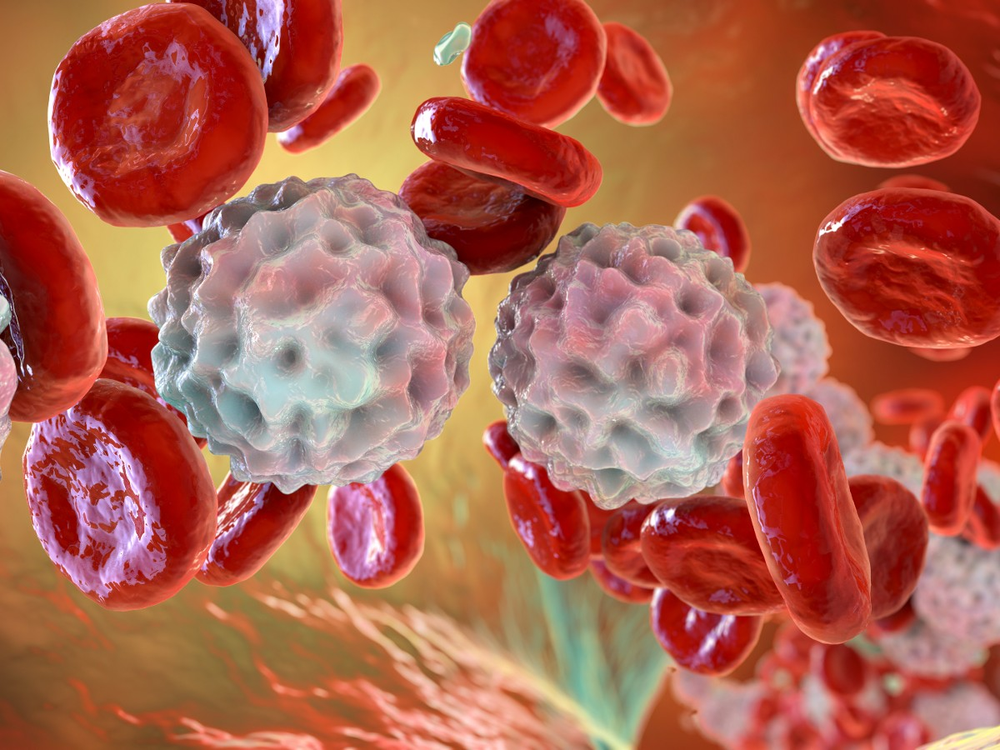


## **About Dataset**

> The images of this dataset were prepared in the bone marrow laboratory of Taleqani Hospital (Tehran, Iran). This dataset consisted of 3242 PBS images from 89 patients suspected of ALL, whose blood samples were prepared and stained by skilled laboratory staff. This dataset is divided into two classes benign and malignant. The former comprises hematogenous, and the latter is the ALL group with three subtypes of malignant lymphoblasts: Early Pre-B, Pre-B, and Pro-B ALL. All the images were taken by using a Zeiss camera in a microscope with a 100x magnification and saved as JPG files. A specialist using the flow cytometry tool made the definitive determination of the types and subtypes of these cells.

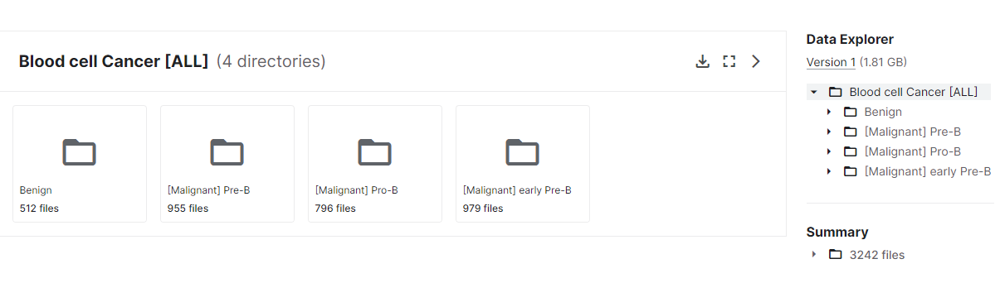




## **Problem Statement**
B-Acute lymphoblastic leukemia (B-ALL) is one of the most prevalent types of leukemia in different age groups. An accurate diagnosis of leukemia demands a range of tools and methods for diagnostics.

**Problem to solve:**
- The large volume of blood microscopic samples poses a challenge for laboratories, leading to diagnostic inaccuracies. Detecting B-cell acute lymphoblastic leukemia (B-ALL) is particularly susceptible to errors due to the time-consuming process of examining blood samples under a microscope, the expertise required by laboratory personnel, and the fatigue they endure on a daily basis.


# **II. IMPORT LIBRARIES**

In [1]:
# Installing 'imutils' Package
!pip install imutils

In [2]:
# Import necessary libraries for image processing and deep learning
import os                            # For operating system-related functions
import random                        # For generating random numbers
import glob                          # For file path manipulation
import cv2                           # For computer vision tasks with OpenCV
import time                          # For timing operations
import numpy as np                   # For numerical computations with arrays
import pandas as pd                  # For data manipulation and analysis
import matplotlib.pyplot as plt      # For data visualization
import tensorflow as tf              # For deep learning with TensorFlow
import seaborn as sns                # For data visualization
from imutils import paths            # For handling image file paths
from sklearn.model_selection import train_test_split  # For splitting data into training and testing sets
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # For image data augmentation
from tensorflow.keras.models import load_model # For load saved model
from sklearn.cluster import KMeans   # For k-means clustering algorithm
import imgaug as ia                  # For image augmentation library
from imgaug import augmenters as iaa # For different image augmentation techniques

# **III. DATA LOADING**

In [3]:
# Kaggle Setup:

# Create a folder named '.kaggle' in the root directory (/root) to store Kaggle API token.
!mkdir ~/.kaggle

# Move the 'kaggle.json' file, which contains the Kaggle API token, to the '.kaggle' folder.
# Make sure we have obtained the 'kaggle.json' file from Kaggle website before running this step.
!cp kaggle.json ~/.kaggle/

# Set appropriate permissions for the 'kaggle.json' file to ensure it's secure.
!chmod 600 ~/.kaggle/kaggle.json

# Dataset Download:

# Download the dataset 'blood-cell-cancer-all-4class' from Kaggle using Kaggle CLI.
# The dataset contains information related to blood cell images for cancer classification.
!kaggle datasets download -d mohammadamireshraghi/blood-cell-cancer-all-4class

# Dataset Unzip:

# Unzip the downloaded dataset file and extract its contents to the 'dataset' folder in the current working directory.
# The '-q' flag ensures quiet mode, suppressing unnecessary output during the extraction process.
!unzip -q /content/blood-cell-cancer-all-4class.zip -d dataset

 99% 1.67G/1.68G [00:16<00:00, 139MB/s]
100% 1.68G/1.68G [00:16<00:00, 110MB/s]


## **Data Preparation**

In [4]:
# Data Preparation:

# Create a directory named 'Train' in the '/content/' directory to store the training data.
!mkdir /content/Train/

# Inside the 'Train' directory, create separate directories for each class:

# 'Benign' for benign samples,
!mkdir /content/Train/Benign
# 'Malignant_Pre-B' for malignant samples with pre-B phenotype,
!mkdir /content/Train/Malignant_Pre-B
# 'Malignant_Pro-B' for malignant samples with pro-B phenotype, and
!mkdir /content/Train/Malignant_Pro-B
# 'Malignant_early_Pre-b' for malignant samples with early pre-B phenotype.
!mkdir /content/Train/Malignant_early_Pre-b

# Create a directory named 'Test' in the '/content/' directory to store the testing data.
!mkdir /content/Test/

# Inside the 'Test' directory, create separate directories for each class:

# 'Benign' for benign samples,
!mkdir /content/Test/Benign
# 'Malignant_Pre-B' for malignant samples with pre-B phenotype,
!mkdir /content/Test/Malignant_Pre-B
# 'Malignant_Pro-B' for malignant samples with pro-B phenotype, and
!mkdir /content/Test/Malignant_Pro-B
# 'Malignant_early_Pre-b' for malignant samples with early pre-B phenotype.
!mkdir /content/Test/Malignant_early_Pre-b

# These steps are essential for organizing and preparing the dataset into training and testing sets, with separate directories for each class. This structure will facilitate the data loading process during the model training and evaluation phases.

In [5]:
# Data Directory and File List:

# Set the 'data_dir' variable to the directory containing the dataset.
# The dataset contains images of blood cell cancer, with separate subdirectories for each class.
data_dir  = '/content/dataset/Blood cell Cancer [ALL]'
# Use 'paths.list_images' function from 'imutils' to get a list of image file paths from 'data_dir'.
# The 'sorted' function ensures that the image list is sorted in alphabetical order for consistency.
data_list = sorted(list(paths.list_images(data_dir)))
# Random Data Shuffle:
# Seed the random number generator with 'random.seed(88)' to ensure reproducibility of the random shuffle.
random.seed(88)
# Shuffle the 'data_list' containing image file paths to randomize the order.
# This step is essential to ensure that the data is randomly distributed for training and testing.
random.shuffle(data_list)
# Data Split:
train_list, test_list = train_test_split(data_list, train_size=0.90, shuffle=True, random_state=88)
# Print the number of files in the testing and training sets for inspection and validation.
print('number of testing list -:',len(test_list))
print('number of training list-:',len(train_list))

number of testing list -: 325
number of training list-: 2917


The total number of samples in the entire dataset can be calculated by adding the number of testing and training samples: 325 (testing) + 2917 (training) = 3242. The split ratio between testing and training sets determines how much data is used for each purpose. In this case, approximately 90% of the data is allocated to the training set, and approximately 10% is allocated to the testing set.

In [6]:
# Dataset Information:

# Print the total number of samples in the entire dataset.p
print('Number of samples in dataset:',len(list(
    paths.list_images("/content/dataset/Blood cell Cancer [ALL]"))),'\n')
# Print the number of samples in each class:
print('Number of samples in each class:','\n')
print("#1 Benign ---------------:", len(list(paths.list_images("/content/dataset/Blood cell Cancer [ALL]/Benign"))))
print("#2 Malignant[Early PreB] :", len(list(paths.list_images("/content/dataset/Blood cell Cancer [ALL]/[Malignant] Pre-B"))))
print("#3 Malignant[PreB] ------:", len(list(paths.list_images("/content/dataset/Blood cell Cancer [ALL]/[Malignant] Pro-B"))))
print("#4 Malignant[ProB] ------:", len(list(paths.list_images("/content/dataset/Blood cell Cancer [ALL]/[Malignant] early Pre-B"))))

Number of samples in dataset: 3242 

Number of samples in each class: 

#1 Benign ---------------: 512
#2 Malignant[Early PreB] : 955
#3 Malignant[PreB] ------: 796
#4 Malignant[ProB] ------: 979


1. Benign ---------------: 512": This indicates that there are 512 samples belonging to the "Benign" class. In the context of the dataset, "Benign" likely represents a category of samples that are classified as non-cancerous or normal.

2. Malignant[Early PreB] : 955": This indicates that there are 955 samples in the "Malignant[Early PreB]" class. This class might represent samples of cells or tissues that are classified as malignant (cancerous) and belong to an early stage of cancer development.

3. Malignant[PreB] ------: 796": This line tells us that there are 796 samples in the "Malignant[PreB]" class. This class may represent samples of cells or tissues that are classified as malignant (cancerous) and belong to a more advanced or intermediate stage of cancer development.

4. Malignant[ProB] ------: 979": This line states that there are 979 samples in the "Malignant[ProB]" class. This class might contain samples of cells or tissues that are classified as malignant (cancerous) and belong to an even more advanced or progressed stage of cancer development.

The total number of samples in the entire dataset can be calculated by adding the samples from each class category: 512 (Benign) + 955 (Malignant[Early PreB]) + 796 (Malignant[PreB]) + 979 (Malignant[ProB]) = 3242.

### **Distributing Image to Test Folder**

In [7]:
# Preparation and Storage of Test Data:

# Initialize a counter variable 'p' to keep track of the image number.
p = 0

# Iterate through each image file path in 'test_list'.
for img in test_list[:]:
    # Read the image using 'cv2.imread' and resize it to (224,224) pixels.
    i = cv2.imread(img)
    i = cv2.resize(i, (224, 224))
    # Extract the label from the image file path using 'os.path.sep'.
    lable = img.split(os.path.sep)[4]
    # Create a destination path 'b' to store the image based on its label.
    # If the label is "Benign", store the image in the 'Test/Benign/' subdirectory with a filename containing the label and the image number.
    if lable == "Benign":
        b = ('/content/Test/Benign/' + lable + str(p) + '.png')
    # If the label is "[Malignant] Pre-B", store the image in the 'Test/Malignant_Pre-B/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] Pre-B":
        b = ('/content/Test/Malignant_Pre-B/' + lable + str(p) + '.png')
    # If the label is "[Malignant] Pro-B", store the image in the 'Test/Malignant_Pro-B/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] Pro-B":
        b = ('/content/Test/Malignant_Pro-B/' + lable + str(p) + '.png')
    # If the label is "[Malignant] early Pre-B", store the image in the 'Test/Malignant_early_Pre-b/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] early Pre-B":
        b = ('/content/Test/Malignant_early_Pre-b/' + lable + str(p) + '.png')
    # Increment the image number counter 'p'.
    p += 1
    # Save the image to the destination path 'b' using 'cv2.imwrite'.
    cv2.imwrite(b, i)

### **Distributing Image to Train Folder**

In [8]:
# Preparation and Storage of Train Data:

# Initialize a counter variable 'p' to keep track of the image number.
p = 0

# Record the current time to calculate the time taken for data preparation.
tic = time.perf_counter()

# Iterate through each image file path in 'train_list'.
for img in train_list[:]:
    # Read the image using 'cv2.imread' and resize it to (224,224) pixels.
    i = cv2.imread(img)
    i = cv2.resize(i, (224, 224))
    # Extract the label from the image file path using 'os.path.sep'.
    lable = img.split(os.path.sep)[4]
    # Create a destination path 'b' to store the image based on its label.
    # If the label is "Benign", store the image in the 'Train/Benign/' subdirectory with a filename containing the label and the image number.
    if lable == "Benign":
        b = ('/content/Train/Benign/' + lable + str(p) + '.png')
    # If the label is "[Malignant] Pre-B", store the image in the 'Train/Malignant_Pre-B/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] Pre-B":
        b = ('/content/Train/Malignant_Pre-B/' + lable + str(p) + '.png')
    # If the label is "[Malignant] Pro-B", store the image in the 'Train/Malignant_Pro-B/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] Pro-B":
        b = ('/content/Train/Malignant_Pro-B/' + lable + str(p) + '.png')
    # If the label is "[Malignant] early Pre-B", store the image in the 'Train/Malignant_early_Pre-b/' subdirectory with a filename containing the label and the image number.
    if lable == "[Malignant] early Pre-B":
        b = ('/content/Train/Malignant_early_Pre-b/' + lable + str(p) + '.png')
    # Increment the image number counter 'p'.
    p += 1
    # Save the image to the destination path 'b' using 'cv2.imwrite'.
    cv2.imwrite(b, i)

# Calculate the time taken for data preparation.
toc = time.perf_counter()
time_taken = toc - tic

# Print the time taken for data preparation in seconds.
print(f"Data preparation time: {time_taken:.2f} seconds")

Data preparation time: 65.65 seconds


In [9]:
# Print the number of samples in the test set for each class.
print('Number of samples in test set:','\n')
print("#1 Benign ---------------:", len(list(paths.list_images("/content/Test/Benign"))))
print("#2 Malignant[Early PreB] :", len(list(paths.list_images("/content/Test/Malignant_Pre-B"))))
print("#3 Malignant[PreB] ------:", len(list(paths.list_images("/content/Test/Malignant_Pro-B"))))
print("#4 Malignant[ProB] ------:", len(list(paths.list_images("/content/Test/Malignant_early_Pre-b"))),'\n')
# Print the number of samples in the train set for each class.
print('Number of samples in train set:','\n')
print("#1 Benign ---------------:", len(list(paths.list_images("/content/Train/Benign"))))
print("#2 Malignant[Early PreB] :", len(list(paths.list_images("/content/Train/Malignant_Pre-B"))))
print("#3 Malignant[PreB] ------:", len(list(paths.list_images("/content/Train/Malignant_Pro-B"))))
print("#4 Malignant[ProB] ------:", len(list(paths.list_images("/content/Train/Malignant_early_Pre-b"))))

Number of samples in test set: 

#1 Benign ---------------: 43
#2 Malignant[Early PreB] : 93
#3 Malignant[PreB] ------: 78
#4 Malignant[ProB] ------: 111 

Number of samples in train set: 

#1 Benign ---------------: 469
#2 Malignant[Early PreB] : 862
#3 Malignant[PreB] ------: 718
#4 Malignant[ProB] ------: 868


# **IV. EXPLORATORY DATA ANALYSIS (EDA)**

## **Image Directeries**

In [10]:
# Train Data Directory Walk:

# Use 'os.walk' to traverse the 'Train' directory and its subdirectories.
# The 'os.walk' function generates the file names in a directory tree by walking either top-down or bottom-up through the directory tree.

# For each directory ('dirpath') encountered during the walk:
# - 'dirnames' will be a list of the names of the subdirectories in 'dirpath'.
# - 'filenames' will be a list of the names of the non-directory files in 'dirpath'.

# This loop will be executed for each directory within the 'Train' directory, showing the directory structure and the number of images in each subdirectory.
for dirpath, dirnames, filenames in os.walk("Train") :
  # Print the number of directories ('dirnames') and the number of images ('filenames') in the current directory ('dirpath').
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in ' {dirpath}':")

# This loop will be executed for each directory within the 'Test' directory, showing the directory structure and the number of images in each subdirectory.
for dirpath, dirnames, filenames in os.walk("Test") :
  # Print the number of directories ('dirnames') and the number of images ('filenames') in the current directory ('dirpath') of the 'Test' directory.
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in ' {dirpath}':")

There are 4 directories and 0 images in ' Train':
There are 0 directories and 868 images in ' Train/Malignant_early_Pre-b':
There are 0 directories and 862 images in ' Train/Malignant_Pre-B':
There are 0 directories and 718 images in ' Train/Malignant_Pro-B':
There are 0 directories and 469 images in ' Train/Benign':
There are 4 directories and 0 images in ' Test':
There are 0 directories and 111 images in ' Test/Malignant_early_Pre-b':
There are 0 directories and 93 images in ' Test/Malignant_Pre-B':
There are 0 directories and 78 images in ' Test/Malignant_Pro-B':
There are 0 directories and 43 images in ' Test/Benign':


There are 4 directories and 0 images in ' Train':
1. There are 0 directories and 718 images in ' Train/Malignant_Pro-B':
2. There are 0 directories and 862 images in ' Train/Malignant_Pre-B':
3. There are 0 directories and 469 images in ' Train/Benign':
4. There are 0 directories and 868 images in ' Train/Malignant_early_Pre-b':

There are 4 directories and 0 images in ' Test':

1. There are 0 directories and 78 images in ' Test/Malignant_Pro-B':
2. There are 0 directories and 93 images in ' Test/Malignant_Pre-B':
3. There are 0 directories and 43 images in ' Test/Benign':
4. There are 0 directories and 111 images in ' Test/Malignant_early_Pre-b':

In [11]:
# Running the command '!ls -la Train' will display the detailed contents of the 'Train' directory.
!ls -la Train

total 184
drwxr-xr-x 6 root root  4096 Aug  5 08:36 .
drwxr-xr-x 1 root root  4096 Aug  5 08:36 ..
drwxr-xr-x 2 root root 20480 Aug  5 08:37 Benign
drwxr-xr-x 2 root root 61440 Aug  5 08:37 Malignant_early_Pre-b
drwxr-xr-x 2 root root 49152 Aug  5 08:37 Malignant_Pre-B
drwxr-xr-x 2 root root 36864 Aug  5 08:37 Malignant_Pro-B


"total 172": The total size of the files in the directory is 172 kilobytes. This is the sum of the sizes of all files and subdirectories within the current directory.

Overall, this output displays the content, permissions, size, and modification time of each subdirectory in the current directory. The "root root" ownership suggests that these directories are owned by the "root" user and the "root" group.

In [12]:
# Running the command '!ls -la Test' will display the detailed contents of the 'Test' directory.
!ls -la Test

total 32
drwxr-xr-x 6 root root  4096 Aug  5 08:36 .
drwxr-xr-x 1 root root  4096 Aug  5 08:36 ..
drwxr-xr-x 2 root root  4096 Aug  5 08:36 Benign
drwxr-xr-x 2 root root 12288 Aug  5 08:36 Malignant_early_Pre-b
drwxr-xr-x 2 root root  4096 Aug  5 08:36 Malignant_Pre-B
drwxr-xr-x 2 root root  4096 Aug  5 08:36 Malignant_Pro-B


"total 32": The total size of the files in the directory is 32 kilobytes. This is the sum of the sizes of all files and subdirectories within the current directory.

Overall, this output displays the content, permissions, size, and modification time of each subdirectory in the current directory. The "root root" ownership suggests that these directories are owned by the "root" user and the "root" group. The sizes indicate the amount of disk space each subdirectory occupies, and the modification times indicate when each subdirectory was last modified.

In [13]:
# File Paths Collection:

# Use 'glob.glob' to collect file paths for images in each class from the 'Train' directory.
Benign_files = glob.glob('/content/Train/Benign/*')
Malignant_Pre_B_files = glob.glob('//content/Train/Malignant_Pre-B/*')
Malignant_Pro_B_files = glob.glob('/content/Train/Malignant_Pro-B/*')
Malignant_Early_Pre_B_files = glob.glob('/content/Train/Malignant_early_Pre-b/*')

## **Image Setup**

In [14]:
# Image Data Preparation:

# Set the image size for resizing all images to 224x224 pixels.
IMG_SIZE = 224

# Set the 'path' variable to the directory containing the training data ('Train' directory).
path = '/content/Train/'

# Image Data Generator:

# Create an image data generator using 'tf.keras.preprocessing.image.ImageDataGenerator()'.
datagen = tf.keras.preprocessing.image.ImageDataGenerator()
# In this line of code, we use the previously created 'datagen' image data generator to generate data flow from a specified directory ('path').
data = datagen.flow_from_directory(path, (IMG_SIZE, IMG_SIZE), batch_size=32, class_mode='binary') #class_mode = categorical for multiclass

Found 2917 images belonging to 4 classes.


In [15]:
# Use 'data.next()' to fetch the next batch of data from the 'data' object.
data.next()

(array([[[[155., 165., 228.],
          [128., 152., 222.],
          [132., 157., 228.],
          ...,
          [144., 130., 224.],
          [136., 125., 224.],
          [136., 117., 222.]],
 
         [[149., 164., 226.],
          [130., 154., 218.],
          [136., 157., 230.],
          ...,
          [148., 133., 222.],
          [144., 139., 221.],
          [133., 119., 217.]],
 
         [[143., 160., 226.],
          [129., 152., 222.],
          [135., 158., 225.],
          ...,
          [151., 126., 227.],
          [161., 151., 227.],
          [133., 132., 226.]],
 
         ...,
 
         [[216., 225., 254.],
          [216., 223., 251.],
          [209., 218., 251.],
          ...,
          [196., 183., 250.],
          [193., 188., 247.],
          [181., 179., 252.]],
 
         [[219., 223., 253.],
          [214., 222., 253.],
          [212., 219., 255.],
          ...,
          [199., 191., 247.],
          [201., 193., 245.],
          [183., 179., 248.

In [16]:
# Use 'data.next()[0].shape' to check the shape of the next batch of data from the 'data' object.
data.next()[0].shape

(32, 224, 224, 3)

In [17]:
# Use 'data.next()[0][0]' to access the first sample (image) in the next batch of data from the 'data' object.
data.next()[0][0]

array([[[225., 222., 243.],
        [225., 221., 243.],
        [217., 212., 233.],
        ...,
        [199., 196., 223.],
        [220., 211., 226.],
        [230., 222., 234.]],

       [[223., 220., 245.],
        [225., 222., 241.],
        [223., 217., 235.],
        ...,
        [193., 190., 211.],
        [214., 210., 225.],
        [230., 221., 230.]],

       [[224., 222., 240.],
        [224., 221., 238.],
        [220., 216., 230.],
        ...,
        [196., 193., 220.],
        [210., 207., 224.],
        [230., 220., 230.]],

       ...,

       [[227., 218., 242.],
        [199., 202., 243.],
        [195., 196., 242.],
        ...,
        [238., 237., 255.],
        [238., 236., 252.],
        [241., 239., 254.]],

       [[218., 211., 245.],
        [195., 196., 241.],
        [189., 193., 240.],
        ...,
        [238., 237., 253.],
        [239., 237., 254.],
        [238., 236., 254.]],

       [[211., 203., 244.],
        [194., 194., 237.],
        [193., 1

## **Image Visualization**

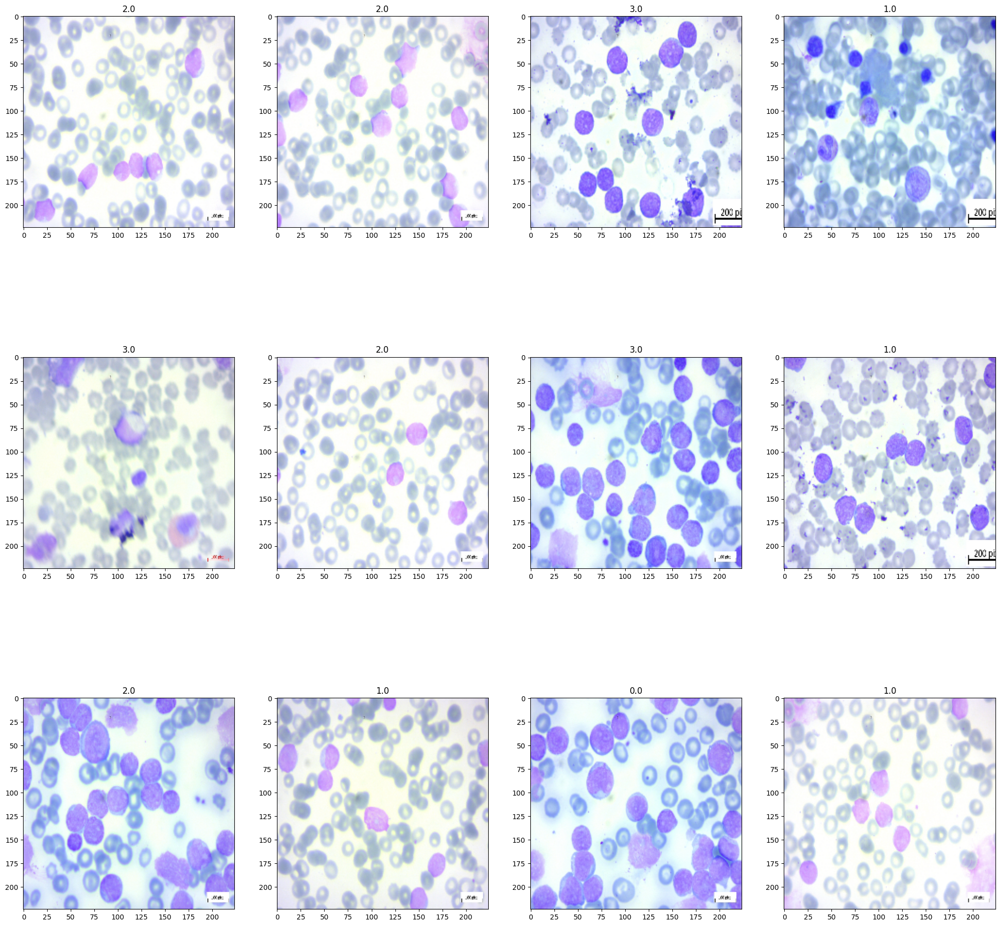

In [18]:
# This code will display a grid of 12 images along with their corresponding labels
fig,ax = plt.subplots(nrows=3,ncols=4,figsize=(25,25))
n=0
for i in range(3):
  for j in range(4):
    # Get the next batch from the 'data' object and access the 'n'-th image.
    img = data.next()[0][n].astype('uint8')
    # Display the image on the corresponding subplot.
    ax[i][j].imshow(img)
    # Set the title of the subplot to display the label of the current image.
    ax[i][j].set_title(data.next()[1][n])
    # Increment the 'n' variable to move to the next image in the batch.
    n+=1

The subplot grid displays a total of 12 images, with each row containing images from one of the four classes. Each subplot shows a single image, and the title of each subplot indicates the class label of the displayed image.

In [19]:
# Use 'data.class_indices' to get a dictionary that maps class names to their corresponding integer indices.
data.class_indices

{'Benign': 0,
 'Malignant_Pre-B': 1,
 'Malignant_Pro-B': 2,
 'Malignant_early_Pre-b': 3}

### **Class 0 - Benign Cell Image Visualization**

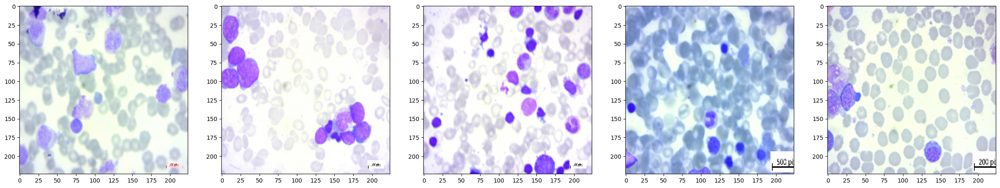

In [20]:
fig,ax = plt.subplots(ncols=5,figsize=(30,30))
for i in range(5):
  cat = plt.imread(Benign_files[i])
  ax[i].imshow(cat)

Benign cell images in the context of acute lymphoblastic leukemia (ALL) refer to non-cancerous cells that are not indicative of leukemia. In the medical field, pathologists and hematologists use specific criteria to identify benign cells and differentiate them from cancerous cells. These criteria include:

1. Normal Cell Morphology: Benign cells typically exhibit normal morphology, meaning they have a regular and uniform appearance. They have well-defined nuclei, cytoplasm, and overall cell structure. The cells should not show any signs of abnormality or atypical features.

2. Normal Cell Count: Benign cell images should show a normal cell count and distribution. This means there should not be an excessive number of cells, as seen in cases of leukemia.

3. No Signs of Leukemia Blast Cells: Benign cells should not contain immature or abnormal cells known as blast cells. Blast cells are characteristic of leukemia and are usually absent in benign cell images.

4. Absence of Abnormal Features: Benign cells should not display any signs of abnormality, such as nuclear enlargement, irregular nuclear shape, or abnormal cytoplasmic inclusions.

5. No Evidence of Malignancy: Benign cells should not exhibit features suggestive of malignancy, such as nuclear hyperchromasia (increased staining intensity), pleomorphism (variation in cell size and shape), or increased mitotic activity.

6. No Distorted Cell Types: The cell types observed in benign cell images should match the normal cell types present in the specific tissue or organ from which the cells originate. The cells should not show features of other unrelated cell types.

7. Normal Cellular Arrangement: In benign cell images, the cells should be arranged in a typical pattern characteristic of the specific tissue or organ they come from.

8. Absence of Abnormal Aggregates: Benign cell images should not display clumping or abnormal aggregates of cells, which might indicate a pathological process.

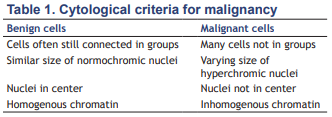

[Benign visual citeria : https://www.researchgate.net/figure/Cytological-criteria-for-malignancy_tbl1_316338786](https://www.researchgate.net/figure/Cytological-criteria-for-malignancy_tbl1_316338786)

### **Class 1 - Malignant Pre-B Cell Image Visualization**

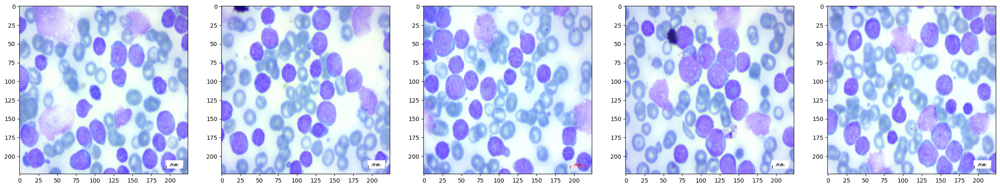

In [21]:
fig,ax = plt.subplots(ncols=5,figsize=(30,30))
for i in range(5):
  cat = plt.imread(Malignant_Pre_B_files[i])
  ax[i].imshow(cat)

malignant Pre-B cells are immature B-lymphocytes that have become cancerous. These cells are characteristic of a specific subtype of ALL, known as Pre-B cell ALL. Pathologists and hematologists use specific criteria to identify malignant Pre-B cells and distinguish them from normal or benign cells. Some of the criteria used to identify malignant Pre-B cells in ALL include:

1. Immature Cell Morphology: Malignant Pre-B cells are characterized by their immature morphology. They typically exhibit less mature features compared to normal B-lymphocytes.

2. Presence of Blast Cells: Malignant Pre-B cells often present as blast cells, which are undifferentiated or immature cells with a high nucleus-to-cytoplasm ratio. Blast cells are hallmarks of acute leukemia and are indicative of rapid cell proliferation.

3. Abnormal Nuclear Features: Malignant Pre-B cells may show abnormal nuclear features, such as hyperchromasia (increased staining intensity), irregular nuclear shape, and prominent nucleoli.

4. Increased Mitotic Activity: Malignant Pre-B cells may display increased mitotic activity, indicating their rapid division and growth.

5. Clonal Expansion: In leukemia, malignant Pre-B cells are derived from a single abnormal progenitor cell, leading to clonal expansion. This clonal expansion is detected through genetic analysis and is an essential diagnostic feature.

### **Class 2 - Malignant Pro-B Cell Image Visualization**

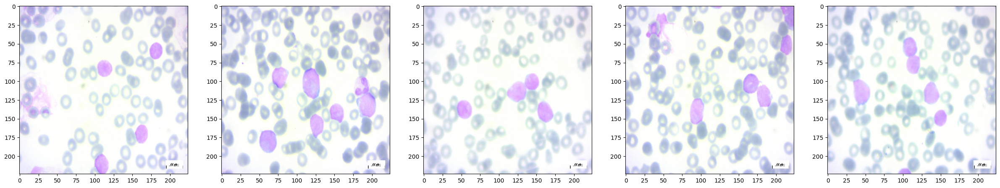

In [22]:
fig,ax = plt.subplots(ncols=5,figsize=(30,30))
for i in range(5):
  cat = plt.imread(Malignant_Pro_B_files[i])
  ax[i].imshow(cat)

malignant Pro-B cells are immature B-lymphocytes that have become cancerous. These cells are characteristic of a specific subtype of ALL, known as Pro-B cell ALL. Pathologists and hematologists use specific criteria to identify malignant Pro-B cells and distinguish them from normal or benign cells. Some of the criteria used to identify malignant Pro-B cells in ALL include:

1. Immature Cell Morphology: Malignant Pro-B cells are characterized by their immature morphology. They typically exhibit less mature features compared to normal B-lymphocytes.

2. Presence of Blast Cells: Malignant Pro-B cells often present as blast cells, which are undifferentiated or immature cells with a high nucleus-to-cytoplasm ratio. Blast cells are hallmarks of acute leukemia and are indicative of rapid cell proliferation.

3. Abnormal Nuclear Features: Malignant Pro-B cells may show abnormal nuclear features, such as hyperchromasia (increased staining intensity), irregular nuclear shape, and prominent nucleoli.

4. Increased Mitotic Activity: Malignant Pro-B cells may display increased mitotic activity, indicating their rapid division and growth.

5. Clonal Expansion: In leukemia, malignant Pro-B cells are derived from a single abnormal progenitor cell, leading to clonal expansion. This clonal expansion is detected through genetic analysis and is an essential diagnostic feature.

6. Immunophenotyping: Flow cytometry immunophenotyping is a valuable diagnostic tool for ALL. Malignant Pro-B cells typically express specific surface markers and antigens associated with B-lymphocytes and exhibit aberrant antigen expression patterns.

7. Chromosomal Abnormalities: Malignant Pro-B cells often have specific chromosomal abnormalities, such as translocations or mutations, which are crucial for classification and risk stratification.

8. Bone Marrow Involvement: In ALL, malignant Pro-B cells infiltrate the bone marrow, leading to a decrease in normal hematopoiesis and an increase in blast cells.

### **Class 3 - Malignant Early Pre-B Cell Image Visualization**

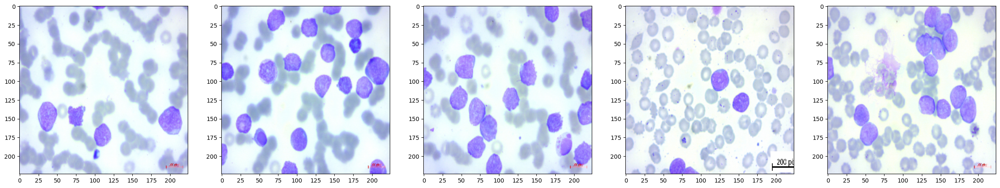

In [23]:
fig,ax = plt.subplots(ncols=5,figsize=(30,30))
for i in range(5):
  cat = plt.imread(Malignant_Early_Pre_B_files[i])
  ax[i].imshow(cat)

malignant early Pre-B cells are immature B-lymphocytes that have become cancerous. These cells are characteristic of a specific subtype of ALL, known as early Pre-B cell ALL. Pathologists and hematologists use specific criteria to identify malignant early Pre-B cells and distinguish them from normal or benign cells. Some of the criteria used to identify malignant early Pre-B cells in ALL include:

1. Immature Cell Morphology: Malignant early Pre-B cells typically exhibit an immature morphology. They may show less mature features compared to normal B-lymphocytes.

2. Presence of Blast Cells: Malignant early Pre-B cells often present as blast cells, which are undifferentiated or immature cells with a high nucleus-to-cytoplasm ratio. Blast cells are hallmarks of acute leukemia and are indicative of rapid cell proliferation.

3. Abnormal Nuclear Features: Malignant early Pre-B cells may show abnormal nuclear features, such as hyperchromasia (increased staining intensity), irregular nuclear shape, and prominent nucleoli.

4. Increased Mitotic Activity: Malignant early Pre-B cells may display increased mitotic activity, indicating their rapid division and growth.

5. Clonal Expansion: In leukemia, malignant early Pre-B cells are derived from a single abnormal progenitor cell, leading to clonal expansion. This clonal expansion is detected through genetic analysis and is an essential diagnostic feature.

6. Immunophenotyping: Flow cytometry immunophenotyping is a valuable diagnostic tool for ALL. Malignant early Pre-B cells typically express specific surface markers and antigens associated with B-lymphocytes and exhibit aberrant antigen expression patterns.

7. Chromosomal Abnormalities: Malignant early Pre-B cells often have specific chromosomal abnormalities, such as translocations or mutations, which are crucial for classification and risk stratification.

8. Bone Marrow Involvement: In ALL, malignant early Pre-B cells infiltrate the bone marrow, leading to a decrease in normal hematopoiesis and an increase in blast cells.

# **V. FEATURE ENGINEERING**

## **Combining Image File Paths and Labels**

In [24]:
# Combine file paths of images from different classes into a single list 'imgs'.
# The 'Benign_files', 'Malignant_Pre_B_files', 'Malignant_Pro_B_files', and 'Malignant_Early_Pre_B_files' lists contain image file paths for each respective class.
imgs = Benign_files + Malignant_Pre_B_files + Malignant_Pro_B_files + Malignant_Early_Pre_B_files
# Create a list 'labels' containing class labels corresponding to the images in the 'imgs' list.
labels = ['Benign' for a in range(len(Benign_files))] + ['Malignant Pre-B' for b in range(len(Malignant_Pre_B_files))] + ['Malignant Pro-B' for c in range(len(Malignant_Pro_B_files))] + ['Malignant early Pre-B' for d in range(len(Malignant_Early_Pre_B_files))]
# Create a DataFrame 'data' using the 'imgs' and 'labels' lists.
data = pd.DataFrame({'images':imgs,'label':labels})
# Shuffle the rows of the DataFrame 'data' to create a random order.
data = data.sample(len(data))
data

,images,label
636,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
1057,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
1241,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
2832,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B
1319,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
...,...,...
952,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
760,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
2006,/content/Train/Malignant_Pro-B/[Malignant] Pro...,Malignant Pro-B
513,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B


<Axes: xlabel='label', ylabel='count'>

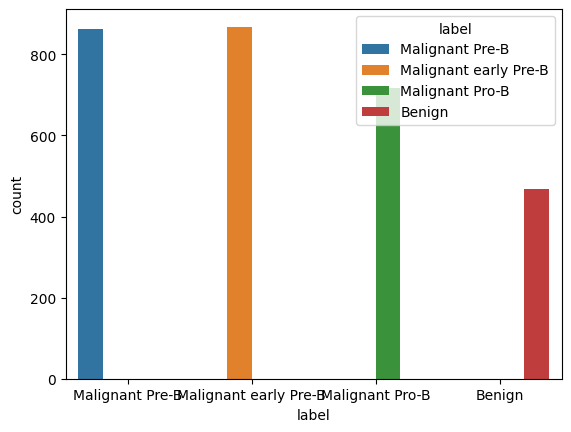

In [25]:
# data visualization
sns.countplot(data=data, x='label', hue='label')

## **Image Augmentation & Data Preprocessing**

In [26]:
# Function to Apply Additional Augmentations using imgaug:

# Define a function 'augment_images' to apply additional augmentations to input images using the 'imgaug' library.
# The function takes 'images' as input, which can be a single image or a list of images.
# If the input is a single image, it is converted to a list to ensure compatibility with 'imgaug'.
def augment_images(images):
    # If the input is a single image, convert it to a list
    if len(images.shape) == 3:
        images = [images]

    # A sequence of image augmentations is defined using 'iaa.Sequential'.
    seq = iaa.Sequential([
        iaa.Resize((224, 224)),  # Resize images to (224, 224)
        iaa.Fliplr(0.5),         # Flip images horizontally with 50% probability
        iaa.Flipud(0.2),         # Flip images vertically with 20% probability
        iaa.Affine(rotate=(-30, 30)),  # Apply random rotations within -30 to 30 degrees
        iaa.GaussianBlur(sigma=(0, 1.0)),  # Add Gaussian blur with random sigma
        iaa.Multiply((0.8, 1.2)),         # Randomly change image brightness
        iaa.AdditiveGaussianNoise(scale=(0, 0.05 * 255)),  # Add Gaussian noise
        # Add more augmentations as needed
    ], random_order=True)

    augmented_images = seq.augment_images(images)

    # If there was a single image, return the first element as a single image
    if len(images) == 1:
        augmented_images = augmented_images[0]

    return augmented_images

# Split the data into training and validation sets with a validation split of 0.2 ('validation_split=0.2').
# Create the 'train' and 'val' generators using 'imgen.flow_from_dataframe'.
imgen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=augment_images, validation_split=0.2)
# These generators are ready to be used for training and validating a machine learning or deep learning model using the augmented data.
train = imgen.flow_from_dataframe(data,
    x_col='images',
    y_col='label',
    target_size=(224,224),
    class_mode='categorical',
    subset='training',
    shuffle=False
)

val = imgen.flow_from_dataframe(data,
    x_col='images',
    y_col='label',
    target_size=(224,224),
    class_mode='categorical',
    subset='validation',
    shuffle=False
)



Found 2334 validated image filenames belonging to 4 classes.
Found 583 validated image filenames belonging to 4 classes.


## **Augmentation Result**

### Train Augmentation Result

/usr/local/lib/python3.10/dist-packages/matplotlib/text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


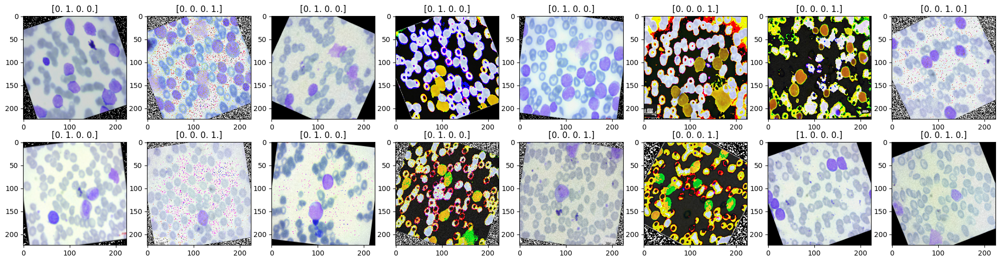

In [27]:
# Visualize some augmented images in train_set
fig, ax = plt.subplots(nrows=2, ncols=8, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(8):
        img = train.next()[0][n].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(train.next()[1][n])
        n += 1
plt.show()

### Validation Augmentation Result

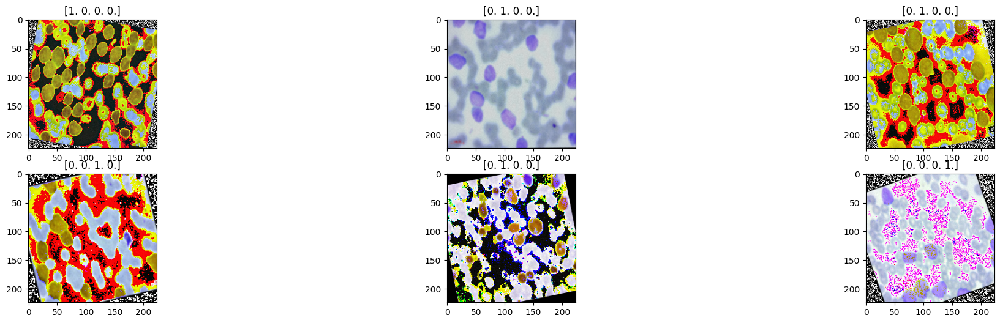

In [28]:
# Visualize some augmented images in val set
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(25, 6))
n = 0
for i in range(2):
    for j in range(3):
        img = val.next()[0][n].astype('uint8')
        ax[i][j].imshow(img)
        ax[i][j].set_title(val.next()[1][n])
        n += 1
plt.show()

The augmentation method used is a combination of several image augmentation techniques applied sequentially to create a diverse and expanded dataset for training machine learning models. Each augmentation technique contributes to varying degrees of randomness and transformation to the original images, resulting in an augmented dataset with increased variability.

1. Resize: The images are resized to a fixed size of 224x224 pixels, ensuring uniformity in the input size for the model.

2. Flip Horizontal (Fliplr): Each image has a 50% chance of being horizontally flipped. This augmentation introduces mirror images of the original ones, which helps the model learn better generalization.

3. Flip Vertical (Flipud): Each image has a 20% chance of being vertically flipped. This adds additional variation to the dataset and helps the model become more robust to different orientations.

4. Affine Transformation (Rotate): Each image is randomly rotated within the range of -30 to 30 degrees. This introduces variations in image orientation, which is particularly useful for scenarios where the object of interest may have different orientations.

5. Gaussian Blur: A random Gaussian blur is applied to each image with a randomly selected sigma value between 0 and 1.0. This augmentation introduces smoothness and reduces the effect of noise, helping the model to focus on important features.

6. Brightness Multiplication (Multiply): The brightness of each image is randomly multiplied by a factor between 0.8 and 1.2. This augmentation alters the intensity of the image, making it less sensitive to varying lighting conditions.

7. Additive Gaussian Noise: Gaussian noise with a randomly selected scale between 0 and 0.05 times 255 (the maximum pixel value) is added to each image. This augmentation helps the model become more robust to noise and improves its ability to handle real-world data.

By combining these augmentation techniques, this is effectively increasing the size and diversity of our training dataset. This helps prevent overfitting and allows our model to learn a wider range of patterns and features, ultimately leading to better generalization and improved performance on unseen data.

# **VI. MODEL DEFINITION**

Convolutional Neural Network (CNN) is a type of deep learning algorithm used for image classification tasks. It is particularly effective in handling image data due to its ability to automatically learn relevant features directly from the raw pixel values. CNNs are widely used in various computer vision applications, including medical image analysis, where they have shown great success in classifying different types of images, such as distinguishing between Benign, Malignant_Pre-B, Malignant_Pro-B, and Malignant_early_Pre-b images in the context of acute lymphoblastic leukemia (ALL).

Here's how a CNN works and how it can be used to classify the different types of leukemia cell images:

1. Convolutional Layers: The CNN starts with one or more convolutional layers. Each convolutional layer consists of multiple filters (also called kernels) that slide over the input image to extract features. These filters are small in size and learn to detect specific patterns and edges in the images. The convolution operation results in feature maps that highlight relevant local patterns in the image.

2. Activation Function: After each convolutional layer, an activation function (such as ReLU - Rectified Linear Unit) is applied element-wise to introduce non-linearity in the network. This helps the CNN learn more complex and abstract features.

3. Pooling Layers: Pooling layers follow the convolutional layers and downsample the feature maps to reduce computational complexity and extract dominant features. Common pooling operations include max-pooling, which selects the maximum value from a local region in the feature map.

4. Fully Connected Layers: After several convolutional and pooling layers, the CNN typically has one or more fully connected layers. These layers flatten the extracted features into a one-dimensional vector and connect them to a final output layer.

5. Output Layer: The output layer consists of one node per class to be predicted (in this case, four nodes for the four classes: Benign, Malignant_Pre-B, Malignant_Pro-B, and Malignant_early_Pre-b). A suitable activation function (e.g., softmax for multiclass classification) is used to produce the probability distribution over the classes.

Training and Classification Process:

1. Training: To train the CNN, a labeled dataset of images containing examples of each class is used. The CNN learns to optimize its internal parameters (weights and biases) to minimize the difference between its predicted outputs and the true labels. This is typically achieved using a loss function such as categorical cross-entropy.

2. Validation: During training, a portion of the labeled dataset is set aside as a validation set to monitor the model's performance and prevent overfitting. The model's performance on the validation set is used to adjust hyperparameters and prevent overfitting.

3. Testing: After training, the CNN is evaluated on a separate test dataset, which it has not seen during training or validation. This allows for an unbiased assessment of the model's performance on unseen data.

4. Inference: Once trained, the CNN can be used for inference to predict the class of new, unseen images. The image is passed through the trained CNN, and the output node with the highest probability represents the predicted class.

The success of the CNN in image classification for leukemia cell images relies on its ability to automatically learn discriminative features from the images during training. By leveraging the convolutional layers and hierarchical learning, the CNN can effectively capture relevant patterns and variations present in the different types of leukemia cell images, enabling accurate classification between Benign, Malignant_Pre-B, Malignant_Pro-B, and Malignant_early_Pre-b images based on the learned criteria. The effectiveness of the CNN in this task depends on the quality and diversity of the training data, the architecture of the network, and appropriate hyperparameter tuning.

## API Sequential

The CNN Sequential API is a high-level interface provided by TensorFlow and Keras for building Convolutional Neural Networks (CNNs) in a sequential manner. It allows to create CNN models step by step, layer by layer, making it easy to design and implement deep learning models for image classification and other computer vision tasks.

The CNN Sequential API is best suited for simpler and straightforward CNN architectures where the data flows sequentially through the layers without any complex branching or multiple inputs/outputs. It is particularly useful for building traditional deep CNN models for image classification tasks.

The Sequential API is a good fit when:

1. Sequential Flow: The model follows a linear sequence of layers, with each layer connected to the one before it and the one after it. This is the case for most common CNN architectures used for image classification.

2. Single Input, Single Output: The model has a single input and a single output. For example, in image classification, the model takes an image as input and predicts the class label as output.

3. No Shared Layers: The model does not require shared layers, where multiple layers have the same weights or features from one layer are passed to multiple subsequent layers.

4. Easy and Fast Prototyping: The Sequential API is very easy to use and requires less code, making it ideal for quick prototyping and experimentation.

5. Simple Image Classification Tasks: When the goal is to build a straightforward image classification model without complex architectures like Siamese networks or multi-input models, the Sequential API is sufficient.

## API Functional

The CNN Functional API is another approach to building Convolutional Neural Networks (CNNs) in TensorFlow and Keras. Unlike the Sequential API, which is a linear stack of layers, the Functional API allows for more flexibility in designing complex CNN architectures with multiple inputs and outputs, as well as the ability to create shared layers and build branched networks.

The CNN Functional API is best suited for more complex CNN architectures that require flexibility, customization, and handling multiple inputs or outputs. It is particularly useful when building sophisticated models that involve:

1. Multiple Inputs/Outputs: The Functional API allows us to build models with multiple input branches or multiple output heads. This is useful for tasks like multi-task learning, where the model needs to simultaneously predict multiple outputs, or for architectures like Siamese networks, where the same model processes two different inputs.

2. Shared Layers: When we need to share layers or weights between different parts of the model, the Functional API is the way to go. This can be beneficial for reducing the number of parameters and improving model efficiency.

3. Skip Connections: If CNN architecture involves skip connections, where the output of one layer is connected to non-sequential layers further down the network, the Functional API allows us to implement these connections easily.

4. Layer Concatenation and Branching: The Functional API enables layer concatenation and branching, which is useful for combining features from different parts of the network or implementing custom layer connections.

5. Custom Architectures: When building custom architectures that deviate from the linear sequential flow, the Functional API gives us more freedom to define how the data flows through the layers.

6. Complex Computer Vision Tasks: The Functional API is well-suited for advanced computer vision tasks, such as image segmentation, object detection, and image captioning, where more complex architectures are typically required.

7. Transfer Learning: When fine-tuning pre-trained models or building models with pre-trained layers, the Functional API allows us to have more control over how the pre-trained layers are integrated into the model.

# **VII. MODEL TRAINING**

## API Sequential

In [29]:
# set the seed
tf.random.set_seed(42)

# Build a CNN model_1 sequential
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(10,3, activation="relu"),
    tf.keras.layers.Conv2D(10,3, activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation="softmax")
])

# Compile our CNN Model_1
model_1.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit the model_1
history_1 = model_1.fit(train,
                        epochs=25,
                        steps_per_epoch=len(train),
                        validation_data=val,
                        validation_steps=len(val))

Epoch 1/25
73/73 [==============================] - 39s 371ms/step - loss: 67.6309 - accuracy: 0.2875 - val_loss: 1.3918 - val_accuracy: 0.3173
Epoch 2/25
73/73 [==============================] - 27s 374ms/step - loss: 1.3713 - accuracy: 0.3136 - val_loss: 1.3441 - val_accuracy: 0.3551
Epoch 3/25
73/73 [==============================] - 26s 359ms/step - loss: 1.3500 - accuracy: 0.3265 - val_loss: 1.3390 - val_accuracy: 0.3362
Epoch 4/25
73/73 [==============================] - 26s 354ms/step - loss: 1.3129 - accuracy: 0.3740 - val_loss: 1.2926 - val_accuracy: 0.3654
Epoch 5/25
73/73 [==============================] - 27s 366ms/step - loss: 1.2649 - accuracy: 0.4109 - val_loss: 1.1884 - val_accuracy: 0.4768
Epoch 6/25
73/73 [==============================] - 26s 359ms/step - loss: 1.0581 - accuracy: 0.5467 - val_loss: 1.0676 - val_accuracy: 0.5540
Epoch 7/25
73/73 [==============================] - 26s 358ms/step - loss: 0.8216 - accuracy: 0.6530 - val_loss: 0.7530 - val_accuracy: 0.694

the model is performing well and seems to be learning effectively from the data. The provided training history shows a good balance between accuracy and loss, and the model is not overfitting.

In [30]:
# Model Summary Sequential API
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

The model has a total of 115,374 parameters, all of which are trainable.

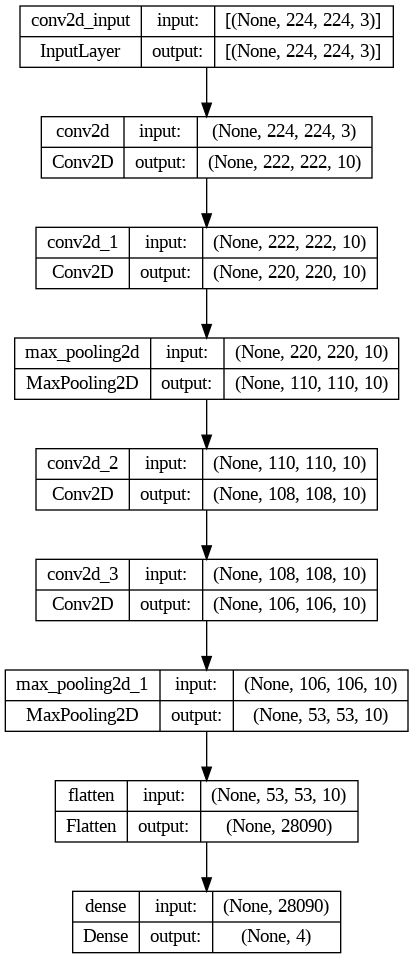

In [31]:
# Architecture Model Sequential API
tf.keras.utils.plot_model(model_1, show_shapes=True)

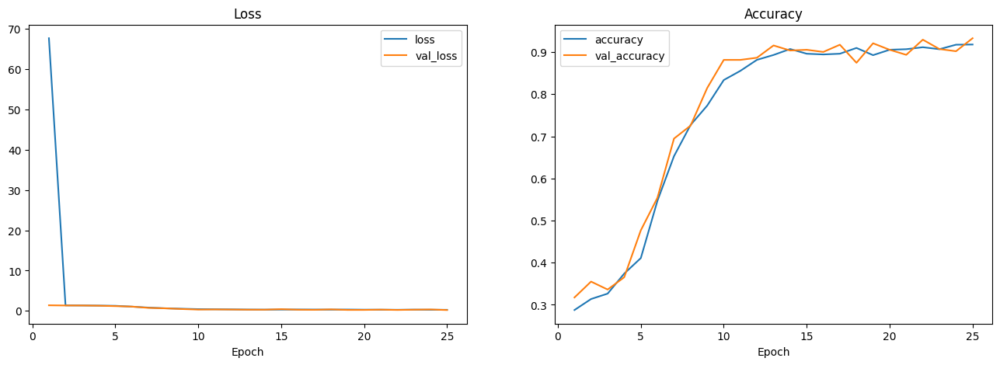

In [32]:
# Model Visualization
# Visualization of Loss and Accuracy during Training:

# Set the number of epochs to 25.
epoch = 25

# Create a subplot with 2 columns to display loss and accuracy plots side by side.
# The 'fig' and 'ax' variables are used to create the subplots with a specified figure size (16x5 inches).
fig, ax = plt.subplots(ncols=2, figsize=(16, 5))

# Loss Plot:
# Plot the training loss and validation loss over the epochs using 'history_1.history['loss']' and 'history_1.history['val_loss']'.
ax[0].plot(range(1, epoch + 1), history_1.history['loss'], label='loss')
ax[0].plot(range(1, epoch + 1), history_1.history['val_loss'], label='val_loss')
ax[0].set_title('Loss')  # Set the title for the subplot.
ax[0].legend()  # Add a legend to the plot.
ax[0].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Accuracy Plot:
# Plot the training accuracy and validation accuracy over the epochs using 'history_1.history['accuracy']' and 'history_1.history['val_accuracy']'.
ax[1].plot(range(1, epoch + 1), history_1.history['accuracy'], label='accuracy')
ax[1].plot(range(1, epoch + 1), history_1.history['val_accuracy'], label='val_accuracy')
ax[1].set_title('Accuracy')  # Set the title for the subplot.
ax[1].legend()  # Add a legend to the plot.
ax[1].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Finally, the 'plt.show()' function is used to display the plots.
plt.show()

In [74]:
#ANN model_1 Sequential
loss_1, accuracy_1 = model_1.evaluate(val)
print('Train accuracy :', accuracy_1)
print('Train loss :', loss_1)

19/19 [==============================] - 5s 251ms/step - loss: 0.2192 - accuracy: 0.9280
Train accuracy : 0.9279588460922241
Train loss : 0.21917694807052612


The model was evaluated on the training dataset, consisting of 19 batches. Each batch took approximately 5 seconds to process. The evaluation resulted in a loss of 0.2191 and an accuracy of 92.79% on the training data.

Summary:

- Training Loss: 0.2191
- Training Accuracy: 92.79%






## API Sequential Improve

In [76]:
# set the seed
tf.random.set_seed(42)

# Build a CNN model_2 sequential improve
model_2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(16, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(4, activation="softmax")
])

# Compile our CNN model_2 sequential improve
model_2.compile(optimizer='adam',
              loss="categorical_crossentropy",
              metrics=['accuracy'])

# Fit the model_2 sequential improve
history_2 = model_2.fit(train,
                        epochs=25,
                        steps_per_epoch=len(train),
                        validation_data=val,
                        validation_steps=len(val))

Epoch 1/25
73/73 [==============================] - 33s 421ms/step - loss: 30.9031 - accuracy: 0.4473 - val_loss: 0.9940 - val_accuracy: 0.6106
Epoch 2/25
73/73 [==============================] - 29s 398ms/step - loss: 0.8067 - accuracy: 0.6949 - val_loss: 0.6278 - val_accuracy: 0.7976
Epoch 3/25
73/73 [==============================] - 26s 363ms/step - loss: 0.5018 - accuracy: 0.8329 - val_loss: 0.4446 - val_accuracy: 0.8576
Epoch 4/25
73/73 [==============================] - 28s 382ms/step - loss: 0.4651 - accuracy: 0.8569 - val_loss: 0.4008 - val_accuracy: 0.8559
Epoch 5/25
73/73 [==============================] - 26s 363ms/step - loss: 0.4059 - accuracy: 0.8689 - val_loss: 0.3272 - val_accuracy: 0.8954
Epoch 6/25
73/73 [==============================] - 32s 444ms/step - loss: 0.3554 - accuracy: 0.8822 - val_loss: 0.3982 - val_accuracy: 0.8593
Epoch 7/25
73/73 [==============================] - 27s 373ms/step - loss: 0.3393 - accuracy: 0.8937 - val_loss: 0.3516 - val_accuracy: 0.878

the model demonstrated excellent performance in classifying the cell images into their respective classes. The results suggest that the model is capable of accurately identifying different types of cells, making it a promising solution for the given task.

In [35]:
# Model Summary Sequential API Improve
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 16)      1456      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 110, 110, 16)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 108, 108, 32)      4640      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 64)       

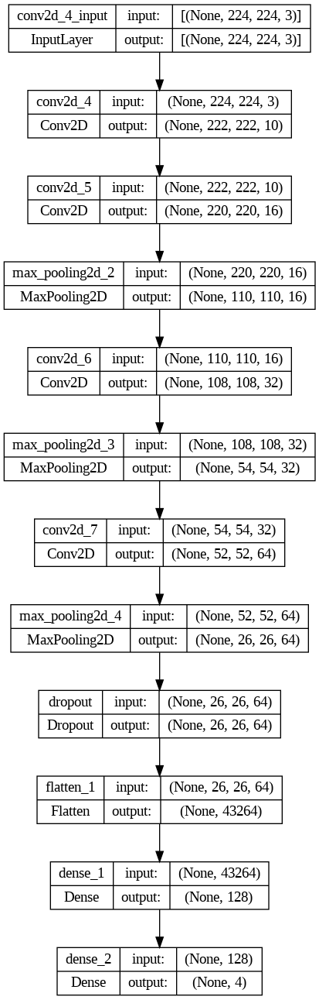

In [36]:
# Architecture model_2 sequential improve
tf.keras.utils.plot_model(model_2, show_shapes=True)

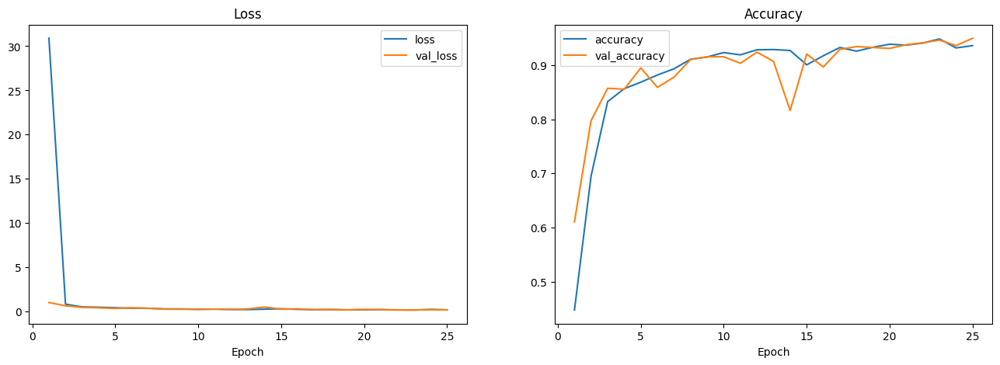

In [77]:
# Model Visualization model_2 sequential improve
# Visualization of Loss and Accuracy during Training:

# Set the number of epochs to 25.
epoch = 25

# Create a subplot with 2 columns to display loss and accuracy plots side by side.
# The 'fig' and 'ax' variables are used to create the subplots with a specified figure size (16x5 inches).
fig, ax = plt.subplots(ncols=2, figsize=(16, 5))

# Loss Plot:
# Plot the training loss and validation loss over the epochs using 'history_2.history['loss']' and 'history_2.history['val_loss']'.
ax[0].plot(range(1, epoch + 1), history_2.history['loss'], label='loss')
ax[0].plot(range(1, epoch + 1), history_2.history['val_loss'], label='val_loss')
ax[0].set_title('Loss')  # Set the title for the subplot.
ax[0].legend()  # Add a legend to the plot.
ax[0].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Accuracy Plot:
# Plot the training accuracy and validation accuracy over the epochs using 'history_2.history['accuracy']' and 'history_2.history['val_accuracy']'.
ax[1].plot(range(1, epoch + 1), history_2.history['accuracy'], label='accuracy')
ax[1].plot(range(1, epoch + 1), history_2.history['val_accuracy'], label='val_accuracy')
ax[1].set_title('Accuracy')  # Set the title for the subplot.
ax[1].legend()  # Add a legend to the plot.
ax[1].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Finally, the 'plt.show()' function is used to display the plots.
plt.show()

In [78]:
#ANN model_1 Sequential Improve
loss_2, accuracy_2 = model_2.evaluate(val)
print('Train accuracy :', accuracy_2)
print('Train loss :', loss_2)

19/19 [==============================] - 5s 249ms/step - loss: 0.1710 - accuracy: 0.9485
Train accuracy : 0.9485419988632202
Train loss : 0.17098522186279297


It appears that the training process achieved a higher accuracy and lower loss in the final epoch. The training accuracy is approximately 94.85%, which is quite good and indicates that the model is performing well on the training data.

## API Functional

In [39]:
# set the seed
tf.random.set_seed(42)

# Input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 3))

# Convolutional layers model_3 Functional API
conv1 = tf.keras.layers.Conv2D(filters=10, kernel_size=3, activation="relu")(input_layer)
conv2 = tf.keras.layers.Conv2D(10, 3, activation="relu")(conv1)
pool1 = tf.keras.layers.MaxPool2D(pool_size=2, padding="valid")(conv2)
conv3 = tf.keras.layers.Conv2D(10, 3, activation="relu")(pool1)
conv4 = tf.keras.layers.Conv2D(10, 3, activation="relu")(conv3)
pool2 = tf.keras.layers.MaxPool2D(2)(conv4)

# Flatten and Dense layer model_3 Functional API
flatten = tf.keras.layers.Flatten()(pool2)
output_layer = tf.keras.layers.Dense(4, activation="softmax")(flatten)

# Create the model using Functional API for model_3
model_3 = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# Compile the model_3 Functional API
model_3.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit the model_3 Functional API
history_3 = model_3.fit(train,
                        epochs=25,
                        steps_per_epoch=len(train),
                        validation_data=val,
                        validation_steps=len(val))# set the seed

Epoch 1/25
73/73 [==============================] - 28s 358ms/step - loss: 60.3203 - accuracy: 0.2922 - val_loss: 1.4005 - val_accuracy: 0.3002
Epoch 2/25
73/73 [==============================] - 27s 371ms/step - loss: 1.3767 - accuracy: 0.3098 - val_loss: 1.3591 - val_accuracy: 0.3345
Epoch 3/25
73/73 [==============================] - 26s 356ms/step - loss: 1.3404 - accuracy: 0.3380 - val_loss: 1.3340 - val_accuracy: 0.3345
Epoch 4/25
73/73 [==============================] - 26s 352ms/step - loss: 1.3133 - accuracy: 0.3582 - val_loss: 1.3036 - val_accuracy: 0.3413
Epoch 5/25
73/73 [==============================] - 26s 360ms/step - loss: 1.2715 - accuracy: 0.3693 - val_loss: 1.2370 - val_accuracy: 0.4288
Epoch 6/25
73/73 [==============================] - 26s 360ms/step - loss: 1.2049 - accuracy: 0.4177 - val_loss: 1.1783 - val_accuracy: 0.4614
Epoch 7/25
73/73 [==============================] - 30s 417ms/step - loss: 1.1451 - accuracy: 0.4717 - val_loss: 1.0912 - val_accuracy: 0.526

The model's performance showed significant improvement over the training epochs, with the final training accuracy reaching approximately 81.06%. The training loss also decreased, indicating that the model is learning meaningful patterns from the training data.

In [40]:
# Model Summary Functional API
model_3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_8 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_9 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 110, 110, 10)     0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_11 (Conv2D)          (None, 106, 106, 10)      910       
                                                             

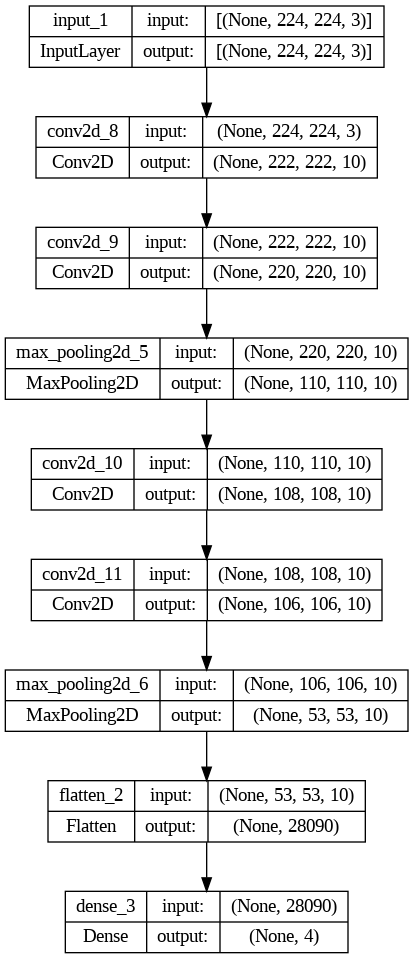

In [41]:
# Architecture model_3 Functional API
tf.keras.utils.plot_model(model_3, show_shapes=True)

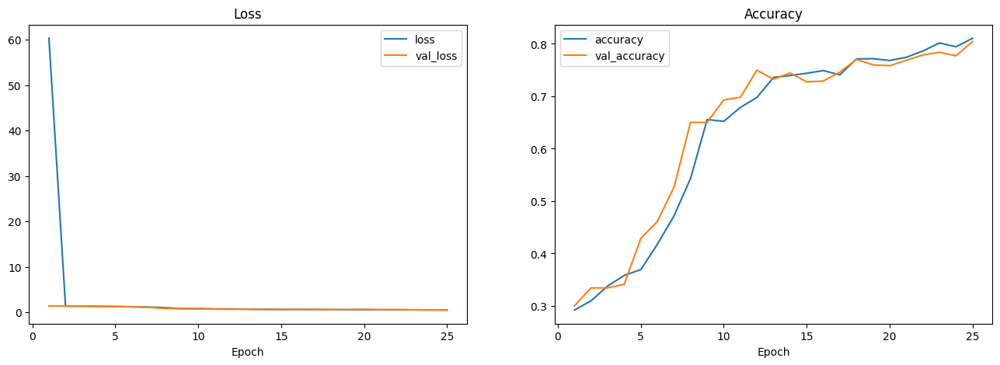

In [42]:
# Model Visualization model_3 Functional API
# Visualization of Loss and Accuracy during Training:

# Set the number of epochs to 25.
epoch = 25

# Create a subplot with 2 columns to display loss and accuracy plots side by side.
# The 'fig' and 'ax' variables are used to create the subplots with a specified figure size (16x5 inches).
fig, ax = plt.subplots(ncols=2, figsize=(16, 5))

# Loss Plot:
# Plot the training loss and validation loss over the epochs using 'history_3.history['loss']' and 'history_3.history['val_loss']'.
ax[0].plot(range(1, epoch + 1), history_3.history['loss'], label='loss')
ax[0].plot(range(1, epoch + 1), history_3.history['val_loss'], label='val_loss')
ax[0].set_title('Loss')  # Set the title for the subplot.
ax[0].legend()  # Add a legend to the plot.
ax[0].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Accuracy Plot:
# Plot the training accuracy and validation accuracy over the epochs using 'history_3.history['accuracy']' and 'history_3.history['val_accuracy']'.
ax[1].plot(range(1, epoch + 1), history_3.history['accuracy'], label='accuracy')
ax[1].plot(range(1, epoch + 1), history_3.history['val_accuracy'], label='val_accuracy')
ax[1].set_title('Accuracy')  # Set the title for the subplot.
ax[1].legend()  # Add a legend to the plot.
ax[1].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Finally, the 'plt.show()' function is used to display the plots.
plt.show()

In [79]:
#ANN model_3 Functional
loss_3, accuracy_3 = model_3.evaluate(val)
print('Train accuracy :', accuracy_3)
print('Train loss :', loss_3)

19/19 [==============================] - 5s 250ms/step - loss: 0.4857 - accuracy: 0.8165
Train accuracy : 0.8164665699005127
Train loss : 0.4857121706008911


The training process in this case resulted in a training accuracy of approximately 81.65%. While this accuracy is not as high as the previous model, it still indicates that the model is learning from the training data.

## API Functional Improve

In [44]:
# set the seed model_4 Functional API Improve
tf.random.set_seed(42)

# Input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 3))

# Convolutional layers model_4 Functional API Improve
conv1 = tf.keras.layers.Conv2D(filters=10, kernel_size=3, activation="relu")(input_layer)
conv2 = tf.keras.layers.Conv2D(16, 3, activation="relu")(conv1)
pool1 = tf.keras.layers.MaxPooling2D()(conv2)
conv3 = tf.keras.layers.Conv2D(32, 3, activation="relu")(pool1)
pool2 = tf.keras.layers.MaxPooling2D()(conv3)
conv4 = tf.keras.layers.Conv2D(64, 3, activation="relu")(pool2)
pool3 = tf.keras.layers.MaxPooling2D()(conv4)

# Dropout and Flatten
dropout = tf.keras.layers.Dropout(0.2)(pool3)
flatten = tf.keras.layers.Flatten()(dropout)

# Dense layers
dense1 = tf.keras.layers.Dense(128, activation='relu')(flatten)
output_layer = tf.keras.layers.Dense(4, activation="softmax")(dense1)
# Create the model using Functional API
model_4 = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# Compile the model_4 Functional API Improve
model_4.compile(optimizer='adam',
                loss="categorical_crossentropy",
                metrics=['accuracy'])

# Fit the model_4 Functional API Improve
history_4 = model_4.fit(train,
                        epochs=25,
                        steps_per_epoch=len(train),
                        validation_data=val,
                        validation_steps=len(val))

Epoch 1/25
73/73 [==============================] - 29s 372ms/step - loss: 11.1249 - accuracy: 0.5664 - val_loss: 0.6360 - val_accuracy: 0.7118
Epoch 2/25
73/73 [==============================] - 26s 358ms/step - loss: 0.6012 - accuracy: 0.7511 - val_loss: 0.5351 - val_accuracy: 0.7839
Epoch 3/25
73/73 [==============================] - 26s 361ms/step - loss: 0.5325 - accuracy: 0.7798 - val_loss: 0.4893 - val_accuracy: 0.7907
Epoch 4/25
73/73 [==============================] - 26s 362ms/step - loss: 0.5030 - accuracy: 0.7986 - val_loss: 0.5101 - val_accuracy: 0.7890
Epoch 5/25
73/73 [==============================] - 28s 384ms/step - loss: 0.4577 - accuracy: 0.8106 - val_loss: 0.4012 - val_accuracy: 0.8319
Epoch 6/25
73/73 [==============================] - 27s 367ms/step - loss: 0.4215 - accuracy: 0.8299 - val_loss: 0.4509 - val_accuracy: 0.8422
Epoch 7/25
73/73 [==============================] - 27s 366ms/step - loss: 0.4931 - accuracy: 0.8042 - val_loss: 0.5400 - val_accuracy: 0.790

With the final training accuracy and validation accuracy being very close, there is a high likelihood that the model is not overfitting to the training data and can generalize well to new, unseen images.

In [45]:
# Model Summary Functional API Improve
model_4.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_12 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_13 (Conv2D)          (None, 220, 220, 16)      1456      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 110, 110, 16)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 108, 108, 32)      4640      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                       

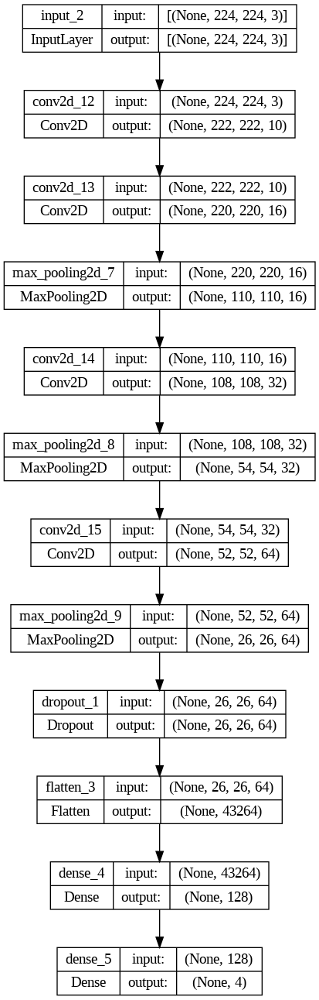

In [46]:
# Architecture model_4 Functional API Improve
tf.keras.utils.plot_model(model_4, show_shapes=True)

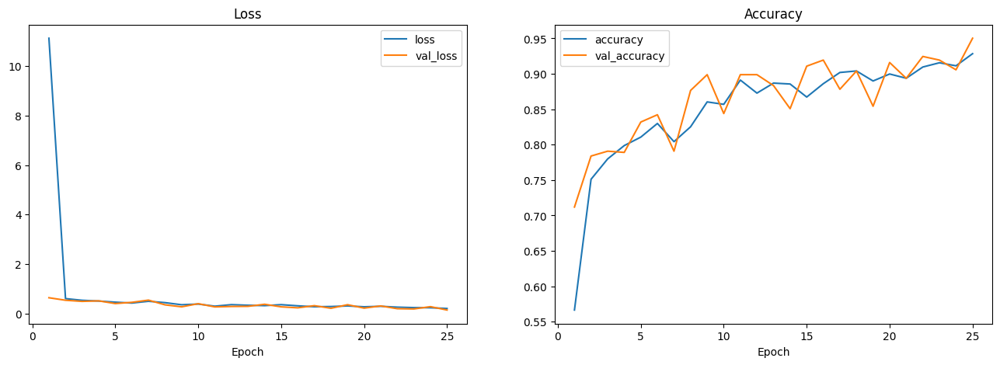

In [47]:
# Model Visualization model_4 Functional API Improve
# Visualization of Loss and Accuracy during Training:

# Set the number of epochs to 25.
epoch = 25

# Create a subplot with 2 columns to display loss and accuracy plots side by side.
# The 'fig' and 'ax' variables are used to create the subplots with a specified figure size (16x5 inches).
fig, ax = plt.subplots(ncols=2, figsize=(16, 5))

# Loss Plot:
# Plot the training loss and validation loss over the epochs using 'history_4.history['loss']' and 'history_4.history['val_loss']'.
ax[0].plot(range(1, epoch + 1), history_4.history['loss'], label='loss')
ax[0].plot(range(1, epoch + 1), history_4.history['val_loss'], label='val_loss')
ax[0].set_title('Loss')  # Set the title for the subplot.
ax[0].legend()  # Add a legend to the plot.
ax[0].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Accuracy Plot:
# Plot the training accuracy and validation accuracy over the epochs using 'history_4.history['accuracy']' and 'history_4.history['val_accuracy']'.
ax[1].plot(range(1, epoch + 1), history_4.history['accuracy'], label='accuracy')
ax[1].plot(range(1, epoch + 1), history_4.history['val_accuracy'], label='val_accuracy')
ax[1].set_title('Accuracy')  # Set the title for the subplot.
ax[1].legend()  # Add a legend to the plot.
ax[1].set_xlabel('Epoch')  # Set the x-axis label for the plot.

# Finally, the 'plt.show()' function is used to display the plots.
plt.show()

In [80]:
#ANN model_4 Functional
loss_4, accuracy_4 = model_4.evaluate(val)
print('Train accuracy :', accuracy_4)
print('Train loss :', loss_4)

19/19 [==============================] - 6s 291ms/step - loss: 0.1285 - accuracy: 0.9588
Train accuracy : 0.958833634853363
Train loss : 0.12846742570400238


he training accuracy has improved to approximately 95.88%. This indicates that the model is learning well from the training data and making accurate predictions on it.

# **VIII. MODEL EVALUATION**

In [101]:
# Test results
results = {
    'Test': ['Sq', 'Fnc', 'Sq Improve', 'Fnc Improve'],
    'Test loss': [loss_1, loss_3, loss_2, loss_4],
    'Test Accuracy': [accuracy_1, accuracy_3, accuracy_2, accuracy_4]
}

# Create the DataFrame
result_model = pd.DataFrame(results)

# Display the DataFrame
result_model

,Test,Test loss,Test Accuracy
0,Sq,0.219177,0.927959
1,Fnc,0.485712,0.816467
2,Sq Improve,0.170985,0.948542
3,Fnc Improve,0.128467,0.958834


Four different models were evaluated in this study: Sequential (Sq), Functional (Fnc), Improved Sequential (Sq Improve), and Improved Functional (Fnc Improve).

The evaluation was performed on a test dataset to assess each model's performance. The metrics used for evaluation were Test Loss and Test Accuracy.

Based on the evaluation results, the best-performing model is "Improved Functional" (Fnc Improve) with a Test Loss of 0.128467 and Test Accuracy of 0.958834. It outperforms all other models in both metrics.

The second-best model is "Improved Sequential" (Sq Improve) with a Test Loss of 0.170985 and Test Accuracy of 0.948542. While it didn't achieve the same level of accuracy as the "Improved Functional" model, it still performed better than the original "Sequential" and "Functional" models.

# **IX. MODEL SAVING**

In [81]:
model_4.save('cnn_model_4.h5')
model_2.save('cnn_model_2.h5')

# **X. MODEL INFERENCE**

In [82]:
# Load the model from the file
loaded_model_4 = load_model('cnn_model_4.h5')
loaded_model_2 = load_model('cnn_model_2.h5')

In [83]:
# File Paths Collection:

# Use 'glob.glob' to collect file paths for images in each class from the 'Test' directory.
Benign_files_test= glob.glob('/content/Test/Benign/*')
Malignant_Pre_B_files_test = glob.glob('/content/Test/Malignant_Pre-B/*')
Malignant_Pro_B_files_test = glob.glob('/content/Test/Malignant_Pro-B*')
Malignant_Early_Pre_B_files_test = glob.glob('/content/Test/Malignant_early_Pre-b/*')

In [84]:
# Combine file paths of images from different classes into a single list 'imgs'.
# The 'Benign_files', 'Malignant_Pre_B_files', 'Malignant_Pro_B_files', and 'Malignant_Early_Pre_B_files' lists contain image file paths for each respective class.
imgs = Benign_files_test + Malignant_Pre_B_files_test + Malignant_Pro_B_files_test + Malignant_Early_Pre_B_files_test
# Create a list 'labels' containing class labels corresponding to the images in the 'imgs' list.
labels = ['Benign' for a in range(len(Benign_files_test))] + ['Malignant Pre-B' for b in range(len(Malignant_Pre_B_files_test))] + ['Malignant Pro-B' for c in range(len(Malignant_Pro_B_files_test))] + ['Malignant early Pre-B' for d in range(len(Malignant_Early_Pre_B_files_test))]
# Create a DataFrame 'data' using the 'imgs' and 'labels' lists.
data_test = pd.DataFrame({'images':imgs,'label':labels})
# Shuffle the rows of the DataFrame 'data' to create a random order.
data_test = data.sample(len(data))
data_test

,images,label
1812,/content/Train/Malignant_Pro-B/[Malignant] Pro...,Malignant Pro-B
2524,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B
2693,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B
80,/content/Train/Benign/Benign1547.png,Benign
2281,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B
...,...,...
2197,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B
1909,/content/Train/Malignant_Pro-B/[Malignant] Pro...,Malignant Pro-B
1149,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B
51,/content/Train/Benign/Benign533.png,Benign


In [85]:
def augment_images(images):
    # If the input is a single image, convert it to a list
    if len(images.shape) == 3:
        images = [images]

    # A sequence of image augmentations is defined using 'iaa.Sequential'.
    seq = iaa.Sequential([
        iaa.Resize((224, 224)),  # Resize images to (224, 224)
        iaa.Fliplr(0.5),         # Flip images horizontally with 50% probability
        iaa.Flipud(0.2),         # Flip images vertically with 20% probability
        iaa.Affine(rotate=(-30, 30)),  # Apply random rotations within -30 to 30 degrees
        iaa.GaussianBlur(sigma=(0, 1.0)),  # Add Gaussian blur with random sigma
        iaa.Multiply((0.8, 1.2)),         # Randomly change image brightness
        iaa.AdditiveGaussianNoise(scale=(0, 0.05 * 255)),  # Add Gaussian noise
        # Add more augmentations as needed
    ], random_order=True)

    augmented_images = seq.augment_images(images)

    # If there was a single image, return the first element as a single image
    if len(images) == 1:
        augmented_images = augmented_images[0]

    return augmented_images

# Split the data into training and validation sets with a validation split of 0.2 ('validation_split=0.2').
# Create the 'train' and 'val' generators using 'imgen.flow_from_dataframe'.
imgen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=augment_images, validation_split=0.2)
# These generators are ready to be used for training and validating a machine learning or deep learning model using the augmented data.
test = imgen.flow_from_dataframe(data_test,
    x_col='images',
    y_col='label',
    target_size=(224,224),
    class_mode='categorical',
    shuffle=False
)

Found 2917 validated image filenames belonging to 4 classes.


In [87]:
prediction_4 = loaded_model_4.predict(test)

92/92 [==============================] - 29s 318ms/step


In [88]:
prediction_2 = loaded_model_2.predict(test)

92/92 [==============================] - 38s 416ms/step


In [89]:
prediction_4

array([[5.6616552e-03, 7.5822724e-03, 9.8197961e-01, 4.7764545e-03],
       [8.9033805e-03, 2.4208970e-05, 2.5267562e-18, 9.9107236e-01],
       [5.2825917e-02, 1.2530060e-04, 1.0528916e-09, 9.4704884e-01],
       ...,
       [5.0949962e-03, 9.9487656e-01, 4.8888785e-20, 2.8494531e-05],
       [9.0352082e-01, 2.4472305e-03, 3.5588594e-06, 9.4028421e-02],
       [2.0347575e-03, 1.5838275e-04, 9.9772900e-01, 7.7850069e-05]],
      dtype=float32)

In [90]:
prediction_2

array([[7.6032896e-03, 3.2020663e-03, 9.8687047e-01, 2.3241704e-03],
       [2.4678308e-04, 1.4975769e-03, 7.3701617e-19, 9.9825567e-01],
       [4.7406723e-04, 2.1332272e-04, 4.3415702e-11, 9.9931264e-01],
       ...,
       [4.6335936e-01, 5.3664064e-01, 0.0000000e+00, 1.4436379e-09],
       [8.1145906e-01, 5.4870084e-02, 1.1436761e-06, 1.3366972e-01],
       [2.6924150e-02, 5.7948781e-03, 9.5955133e-01, 7.7295778e-03]],
      dtype=float32)

In [91]:
predicted_labels_4 = np.argmax(prediction_4, axis=1)
predicted_labels_2 = np.argmax(prediction_2, axis=1)

In [92]:
predicted_labels_4

array([2, 3, 3, ..., 1, 0, 2])

In [93]:
predicted_labels_2

array([2, 3, 3, ..., 1, 0, 2])

In [94]:
class_prediction_4 = []
for i in predicted_labels_4:
  if i == 0:
    class_prediction_4.append('Benign')
  elif i == 1:
    class_prediction_4.append('Malignant Pre-B')
  elif i == 2:
    class_prediction_4.append('Malignant Pro-B')
  elif i == 3:
    class_prediction_4.append('Malignant early Pre-B')

In [95]:
class_prediction_2 = []
for i in predicted_labels_2:
  if i == 0:
    class_prediction_2.append('Benign')
  elif i == 1:
    class_prediction_2.append('Malignant Pre-B')
  elif i == 2:
    class_prediction_2.append('Malignant Pro-B')
  elif i == 3:
    class_prediction_2.append('Malignant early Pre-B')

In [96]:
data_test['class_prediction_4'] = class_prediction_4
data_test['class_prediction_2'] = class_prediction_2

In [97]:
data_test

,images,label,class_prediction_4,class_prediction_2
1812,/content/Train/Malignant_Pro-B/[Malignant] Pro...,Malignant Pro-B,Malignant Pro-B,Malignant Pro-B
2524,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B,Malignant early Pre-B,Malignant early Pre-B
2693,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B,Malignant early Pre-B,Malignant early Pre-B
80,/content/Train/Benign/Benign1547.png,Benign,Benign,Benign
2281,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B,Malignant early Pre-B,Malignant early Pre-B
...,...,...,...,...
2197,/content/Train/Malignant_early_Pre-b/[Malignan...,Malignant early Pre-B,Malignant early Pre-B,Malignant early Pre-B
1909,/content/Train/Malignant_Pro-B/[Malignant] Pro...,Malignant Pro-B,Malignant Pro-B,Malignant Pro-B
1149,//content/Train/Malignant_Pre-B/[Malignant] Pr...,Malignant Pre-B,Malignant Pre-B,Malignant Pre-B
51,/content/Train/Benign/Benign533.png,Benign,Benign,Benign


In [98]:
# Compare the predicted labels with the actual labels
correct_predictions = (data_test['label'] == data_test['class_prediction_4'])

# Calculate the accuracy
accuracy = np.mean(correct_predictions)

# Print the accuracy
print("Accuracy:", accuracy)

Accuracy: 0.954748028796709


In [99]:
# Compare the predicted labels with the actual labels
correct_predictions = (data_test['label'] == data_test['class_prediction_2'])

# Calculate the accuracy
accuracy = np.mean(correct_predictions)

# Print the accuracy
print("Accuracy:", accuracy)

Accuracy: 0.9465203976688379


# **XI. CONCLUSION**

Four different models were evaluated in this study: Sequential (Sq), Functional (Fnc), Improved Sequential (Sq Improve), and Improved Functional (Fnc Improve).

The evaluation was performed on a test dataset to assess each model's performance. The metrics used for evaluation were Test Loss and Test Accuracy.

Based on the evaluation results, the best-performing model is "Improved Functional" (Fnc Improve) with a Test Loss of 0.128467 and Test Accuracy of 0.958834. It outperforms all other models in both metrics.

The second-best model is "Improved Sequential" (Sq Improve) with a Test Loss of 0.170985 and Test Accuracy of 0.948542. While it didn't achieve the same level of accuracy as the "Improved Functional" model, it still performed better than the original "Sequential" and "Functional" models.

## Model Inference

Both the Functional API Improved CNN model and the Sequential API Improved CNN model have exhibited impressive performance in accurately classifying data on the test dataset. The Functional API model slightly outperformed the Sequential API model, achieving an accuracy of 95.47% compared to 94.65%.